# SIADS Milestone II

In [ ]:
!pip install tensorflow
!pip install datasets

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
from PIL import Image
from datasets import load_dataset

In [2]:
artist = ["Unknown Artist", "boris-kustodiev", "camille-pissarro", "childe-hassam", "claude-monet", "edgar-degas", "eugene-boudin", "gustave-dore", "ilya-repin", "ivan-aivazovsky", "ivan-shishkin", "john-singer-sargent", "marc-chagall", "martiros-saryan", "nicholas-roerich", "pablo-picasso", "paul-cezanne", "pierre-auguste-renoir", "pyotr-konchalovsky", "raphael-kirchner", "rembrandt", "salvador-dali", "vincent-van-gogh", "hieronymus-bosch", "leonardo-da-vinci", "albrecht-durer", "edouard-cortes", "sam-francis", "juan-gris", "lucas-cranach-the-elder", "paul-gauguin", "konstantin-makovsky", "egon-schiele", "thomas-eakins", "gustave-moreau", "francisco-goya", "edvard-munch", "henri-matisse", "fra-angelico", "maxime-maufra", "jan-matejko", "mstislav-dobuzhinsky", "alfred-sisley", "mary-cassatt", "gustave-loiseau", "fernando-botero", "zinaida-serebriakova", "georges-seurat", "isaac-levitan", "joaquan-sorolla", "jacek-malczewski", "berthe-morisot", "andy-warhol", "arkhip-kuindzhi", "niko-pirosmani", "james-tissot", "vasily-polenov", "valentin-serov", "pietro-perugino", "pierre-bonnard", "ferdinand-hodler", "bartolome-esteban-murillo", "giovanni-boldini", "henri-martin", "gustav-klimt", "vasily-perov", "odilon-redon", "tintoretto", "gene-davis", "raphael", "john-henry-twachtman", "henri-de-toulouse-lautrec", "antoine-blanchard", "david-burliuk", "camille-corot", "konstantin-korovin", "ivan-bilibin", "titian", "maurice-prendergast", "edouard-manet", "peter-paul-rubens", "aubrey-beardsley", "paolo-veronese", "joshua-reynolds", "kuzma-petrov-vodkin", "gustave-caillebotte", "lucian-freud", "michelangelo", "dante-gabriel-rossetti", "felix-vallotton", "nikolay-bogdanov-belsky", "georges-braque", "vasily-surikov", "fernand-leger", "konstantin-somov", "katsushika-hokusai", "sir-lawrence-alma-tadema", "vasily-vereshchagin", "ernst-ludwig-kirchner", "mikhail-vrubel", "orest-kiprensky", "william-merritt-chase", "aleksey-savrasov", "hans-memling", "amedeo-modigliani", "ivan-kramskoy", "utagawa-kuniyoshi", "gustave-courbet", "william-turner", "theo-van-rysselberghe", "joseph-wright", "edward-burne-jones", "koloman-moser", "viktor-vasnetsov", "anthony-van-dyck", "raoul-dufy", "frans-hals", "hans-holbein-the-younger", "ilya-mashkov", "henri-fantin-latour", "m.c.-escher", "el-greco", "mikalojus-ciurlionis", "james-mcneill-whistler", "karl-bryullov", "jacob-jordaens", "thomas-gainsborough", "eugene-delacroix", "canaletto"]
genre = ["abstract_painting", "cityscape", "genre_painting", "illustration", "landscape", "nude_painting", "portrait", "religious_painting", "sketch_and_study", "still_life", "Unknown Genre"]
style = ["Abstract_Expressionism", "Action_painting", "Analytical_Cubism", "Art_Nouveau", "Baroque", "Color_Field_Painting", "Contemporary_Realism", "Cubism", "Early_Renaissance", "Expressionism", "Fauvism", "High_Renaissance", "Impressionism", "Mannerism_Late_Renaissance", "Minimalism", "Naive_Art_Primitivism", "New_Realism", "Northern_Renaissance", "Pointillism", "Pop_Art", "Post_Impressionism", "Realism", "Rococo", "Romanticism", "Symbolism", "Synthetic_Cubism", "Ukiyo_e"]

In [95]:
# Load wikiart dataset from Hugging Face
# dataset = load_dataset("huggan/wikiart", split='train[0:500]')
# print(dataset)

In [3]:
# Load wikiart dataset from local directory
# dataset = load_dataset("./wikiart", split='train[0:500]')
# dataset = load_dataset("./wikiart", split='train')
# print(dataset)

Resolving data files: 100%|██████████| 72/72 [00:00<00:00, 110619.01it/s]


Dataset({
    features: ['image', 'artist', 'genre', 'style'],
    num_rows: 81444
})


In [ ]:
# sample dataset contains 100 rows
dataset = load_dataset("parquet", data_files='wikiart.parquet', split='train')
dataset

In [4]:
print(dataset[0]["artist"], dataset.features['artist'].int2str(dataset[0]["artist"]))

22 vincent-van-gogh


In [141]:
dataset.features['artist']

ClassLabel(names=['Unknown Artist', 'boris-kustodiev', 'camille-pissarro', 'childe-hassam', 'claude-monet', 'edgar-degas', 'eugene-boudin', 'gustave-dore', 'ilya-repin', 'ivan-aivazovsky', 'ivan-shishkin', 'john-singer-sargent', 'marc-chagall', 'martiros-saryan', 'nicholas-roerich', 'pablo-picasso', 'paul-cezanne', 'pierre-auguste-renoir', 'pyotr-konchalovsky', 'raphael-kirchner', 'rembrandt', 'salvador-dali', 'vincent-van-gogh', 'hieronymus-bosch', 'leonardo-da-vinci', 'albrecht-durer', 'edouard-cortes', 'sam-francis', 'juan-gris', 'lucas-cranach-the-elder', 'paul-gauguin', 'konstantin-makovsky', 'egon-schiele', 'thomas-eakins', 'gustave-moreau', 'francisco-goya', 'edvard-munch', 'henri-matisse', 'fra-angelico', 'maxime-maufra', 'jan-matejko', 'mstislav-dobuzhinsky', 'alfred-sisley', 'mary-cassatt', 'gustave-loiseau', 'fernando-botero', 'zinaida-serebriakova', 'georges-seurat', 'isaac-levitan', 'joaquã\xadn-sorolla', 'jacek-malczewski', 'berthe-morisot', 'andy-warhol', 'arkhip-kuindzh

In [4]:
df = dataset.to_pandas()
df.describe()

,artist,genre,style
count,81444.000000,81444.000000,81444.000000
mean,21.057168,5.484247,14.401454
std,33.322029,3.190594,7.234319
min,0.000000,0.000000,0.000000
25%,0.000000,2.000000,9.000000
50%,0.000000,6.000000,14.000000
75%,25.000000,8.000000,21.000000
max,128.000000,10.000000,26.000000


In [10]:
from io import BytesIO
from PIL import Image

def load_image(image):
    image = Image.open(BytesIO(image['bytes']))
    image = image.resize((256, 256))
    # image = image.convert('L') # grey scale
    return image

## Gogh's Artwork Classification

In [5]:
# Filter Van Gogh paintings only (artist id: 22)
# ds_gogh = dataset.filter(lambda x: x['artist'] == 22)
# df_gogh = ds_gogh.to_pandas()

df_gogh = df[df.apply(lambda x: x['artist'] == 22, axis=1)]
df_gogh.reset_index(drop=True, inplace=True)

print(df_gogh[:5])
df_gogh.describe()

                                               image  artist  genre  style
0  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      22      4     21
1  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      22     10     21
2  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      22      8     21
3  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      22      5     21
4  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      22      6     21


,artist,genre,style
count,1889.0,1889.000000,1889.000000
mean,22.0,6.125463,20.467972
std,0.0,2.732927,0.499105
min,22.0,1.000000,20.000000
25%,22.0,4.000000,20.000000
50%,22.0,8.000000,20.000000
75%,22.0,8.000000,21.000000
max,22.0,10.000000,21.000000


In [6]:
df['artist'].value_counts()

0      41914
22      1889
14      1819
17      1400
4       1334
       ...  
111       84
34        83
127       75
122       48
128       42
Name: artist, Length: 129, dtype: int64

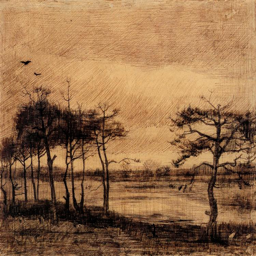

In [24]:
img = load_image(df_gogh['image'][0])
img

In [26]:
# Load all images
images = []
for i in range(len(df_gogh)):
    img = load_image(df_gogh['image'][i])
    img = img.resize((50, 50))
    images.append(np.array(img))

# Convert images to numpy array
images = np.array(images)
images.shape

(1889, 50, 50, 3)

In [27]:
images_2d = images.reshape(-1, 50*50*3)
# images_2d = images.reshape(-1, 256*256) # grey scaled
images_2d.shape

(1889, 7500)

In [28]:
from sklearn.cluster import KMeans

km = KMeans(init='random', n_clusters=3, random_state=42)
km.fit(images_2d)

KMeans(init='random', n_clusters=3, random_state=42)

In [29]:
print(np.unique(km.labels_, return_counts=True))

(array([0, 1, 2], dtype=int32), array([402, 700, 787]))


In [54]:
df_gogh['style'].to_numpy().shape

(1889,)

In [55]:
images_2d.shape

(1889, 7500)

In [46]:
from sklearn.datasets import load_digits

data, labels = load_digits(return_X_y=True)
(n_samples, n_features), n_digits = data.shape, np.unique(labels).size

labels

array([0, 1, 2, ..., 8, 9, 8])

In [40]:
import numpy as np

from sklearn.datasets import load_digits

data, labels = load_digits(return_X_y=True)
(n_samples, n_features), n_digits = data.shape, np.unique(labels).size

print(f"# digits: {n_digits}; # samples: {n_samples}; # features {n_features}")

from time import time

from sklearn import metrics
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


def bench_k_means(kmeans, name, data, labels):
    """Benchmark to evaluate the KMeans initialization methods.

    Parameters
    ----------
    kmeans : KMeans instance
        A :class:`~sklearn.cluster.KMeans` instance with the initialization
        already set.
    name : str
        Name given to the strategy. It will be used to show the results in a
        table.
    data : ndarray of shape (n_samples, n_features)
        The data to cluster.
    labels : ndarray of shape (n_samples,)
        The labels used to compute the clustering metrics which requires some
        supervision.
    """
    t0 = time()
    estimator = make_pipeline(StandardScaler(), kmeans).fit(data)
    fit_time = time() - t0
    results = [name, fit_time, estimator[-1].inertia_]

    # Define the metrics which require only the true labels and estimator
    # labels
    clustering_metrics = [
        metrics.homogeneity_score,
        metrics.completeness_score,
        metrics.v_measure_score,
        metrics.adjusted_rand_score,
        metrics.adjusted_mutual_info_score,
    ]
    results += [m(labels, estimator[-1].labels_) for m in clustering_metrics]

    # The silhouette score requires the full dataset
    results += [
        metrics.silhouette_score(
            data,
            estimator[-1].labels_,
            metric="euclidean",
            sample_size=300,
        )
    ]

    # Show the results
    formatter_result = (
        "{:9s}\t{:.3f}s\t{:.0f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
    )
    print(formatter_result.format(*results))

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

print(82 * "_")
print("init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")

kmeans = KMeans(init="random", n_clusters=n_digits, n_init=4, random_state=0)
bench_k_means(kmeans=kmeans, name="random", data=data, labels=labels)

print(82 * "_")

# digits: 10; # samples: 1797; # features 64
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
random   	0.054s	69707	0.675	0.716	0.694	0.560	0.691	0.180
__________________________________________________________________________________


In [36]:
images_2d

array([[198, 159, 116, ..., 145, 103,  71],
       [ 77,  32,  35, ..., 135, 120, 102],
       [224, 225, 212, ..., 210, 205, 197],
       ...,
       [230, 226, 219, ..., 219, 214, 210],
       [215, 200, 179, ..., 232, 218, 190],
       [243, 240, 233, ..., 234, 235, 231]], dtype=uint8)

In [59]:
from time import time

from sklearn import metrics
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

def bench_k_means(kmeans, name, data, labels):
    """Benchmark to evaluate the KMeans initialization methods.

    Parameters
    ----------
    kmeans : KMeans instance
        A :class:`~sklearn.cluster.KMeans` instance with the initialization
        already set.
    name : str
        Name given to the strategy. It will be used to show the results in a
        table.
    data : ndarray of shape (n_samples, n_features)
        The data to cluster.
    labels : ndarray of shape (n_samples,)
        The labels used to compute the clustering metrics which requires some
        supervision.
    """
    t0 = time()
    estimator = make_pipeline(StandardScaler(), kmeans).fit(data)
    fit_time = time() - t0
    results = [name, fit_time, estimator[-1].inertia_]

    # Define the metrics which require only the true labels and estimator
    # labels
    clustering_metrics = [
        metrics.homogeneity_score,
        metrics.completeness_score,
        metrics.v_measure_score,
        metrics.adjusted_rand_score,
        metrics.adjusted_mutual_info_score,
    ]
    results += [m(labels, estimator[-1].labels_) for m in clustering_metrics]

    # The silhouette score requires the full dataset
    results += [
        metrics.silhouette_score(
            data,
            estimator[-1].labels_,
            metric="euclidean",
            sample_size=300,
        )
    ]

    # Show the results
    formatter_result = (
        "{:9s}\t{:.3f}s\t{:.0f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}\t{:.3f}"
    )
    print(formatter_result.format(*results))

In [62]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

data = images_2d
labels = df_gogh['style'].to_numpy()

print(82 * "_")
print("init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")

kmeans = KMeans(init="k-means++", n_clusters=3, n_init=4, random_state=42)
bench_k_means(kmeans=kmeans, name="k-means++", data=data, labels=labels)

kmeans = KMeans(init="random", n_clusters=3, n_init=4, random_state=42)
bench_k_means(kmeans=kmeans, name="random", data=data, labels=labels)

pca = PCA(n_components=n_digits).fit(data)
kmeans = KMeans(init=pca.components_, n_clusters=n_digits, n_init=1)
bench_k_means(kmeans=kmeans, name="PCA-based", data=data, labels=labels)

print(82 * "_")

__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	1.042s	8963590	0.004	0.002	0.003	0.003	0.002	0.172
random   	1.421s	8963587	0.003	0.002	0.002	0.002	0.002	0.170
PCA-based	1.270s	7463703	0.056	0.017	0.026	0.013	0.025	0.068
__________________________________________________________________________________


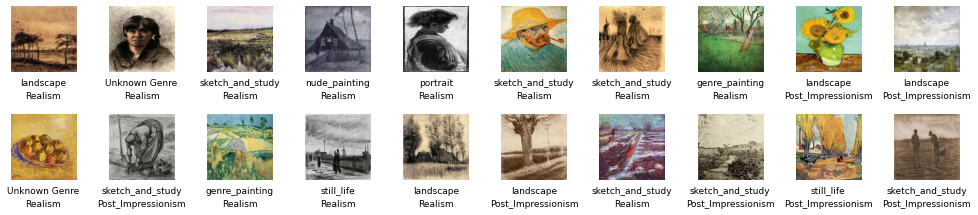

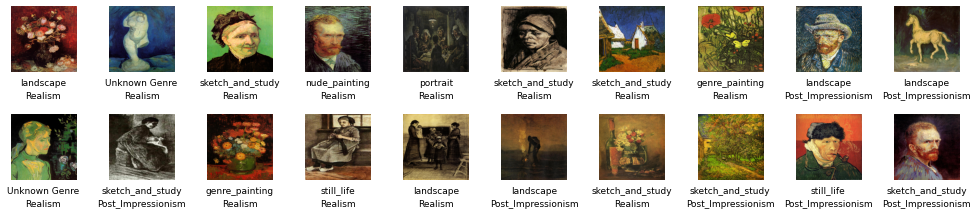

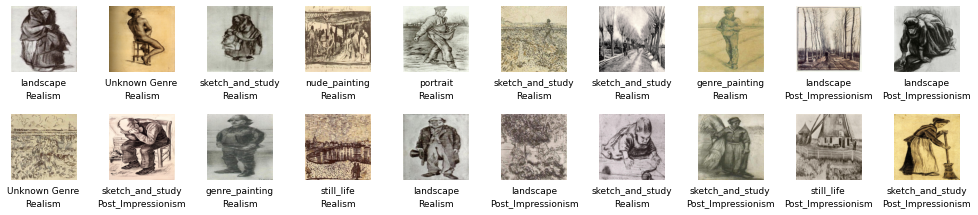

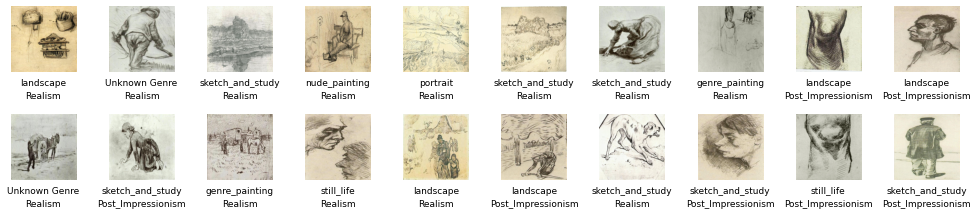

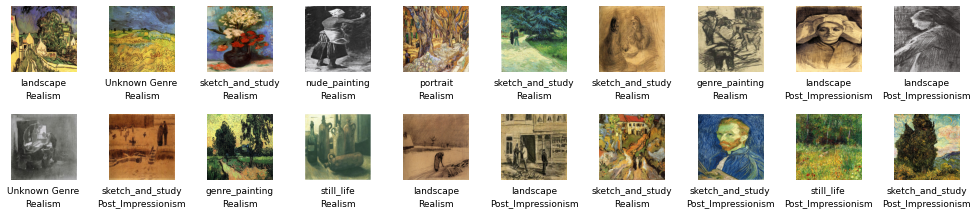

In [191]:
import matplotlib.pyplot as plt

def draw_paints(arr, ratio=1, limit=20):
    n = len(arr) if len(arr) < limit else limit
    rows = int(np.ceil(n/10))
    cols = n if rows < 2 else 10
    fig, axs = plt.subplots(rows, cols, figsize=(cols*ratio, rows*ratio), squeeze=False, gridspec_kw={'wspace':0.5, 'hspace':0.4})
    for i in range(rows):
        for j in range(cols):
            idx = i*10 + j
            lb_genre = genre[df_gogh['genre'][idx]]
            lb_style = style[df_gogh['style'][idx]]
            if idx < n:
                axs[i, j].imshow(arr[idx], cmap='gray_r')
                axs[i, j].text(0.5, -0.2, lb_genre, size=9, ha='center', transform=axs[i, j].transAxes)
                axs[i, j].text(0.5, -0.4, lb_style, size=9, ha='center', transform=axs[i, j].transAxes)
            axs[i, j].axis('off')
    plt.show()

# draw_paints for each label 0 to 5
for i in range(5):
    draw_paints(images[km.labels_ == i], 1.7)

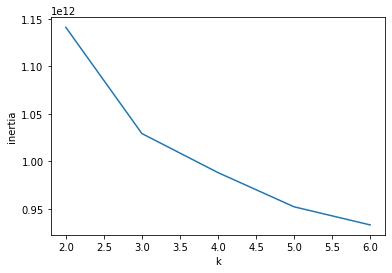

In [104]:
inertia = []
for k in range(2, 7):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(images_2d)
    inertia.append(km.inertia_)

plt.plot(range(2, 7), inertia)
plt.xlabel('k')
plt.ylabel('inertia')
plt.show()

In [179]:
km_fix = KMeans(init='random', n_clusters=3, random_state=42)
km_fix.fit(images_2d)

print(np.unique(km_fix.labels_, return_counts=True))

(array([0, 1, 2], dtype=int32), array([787, 700, 402]))


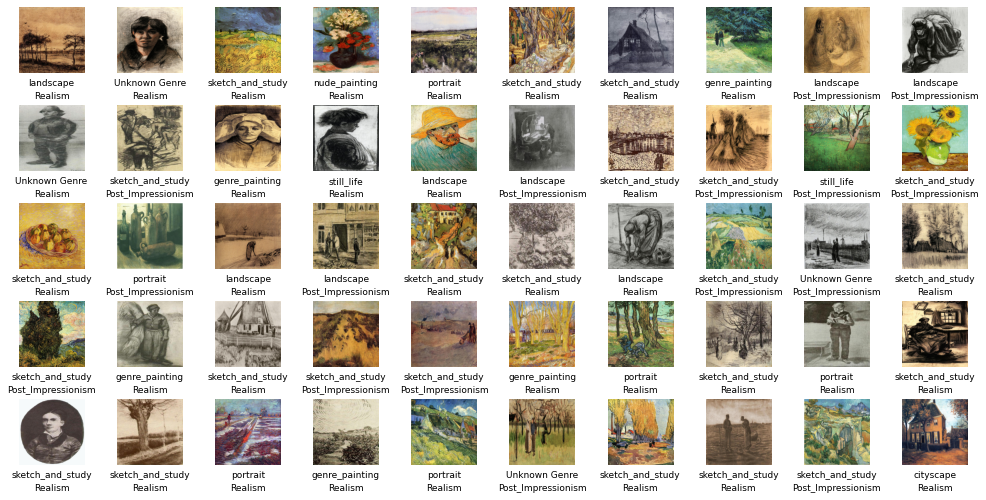

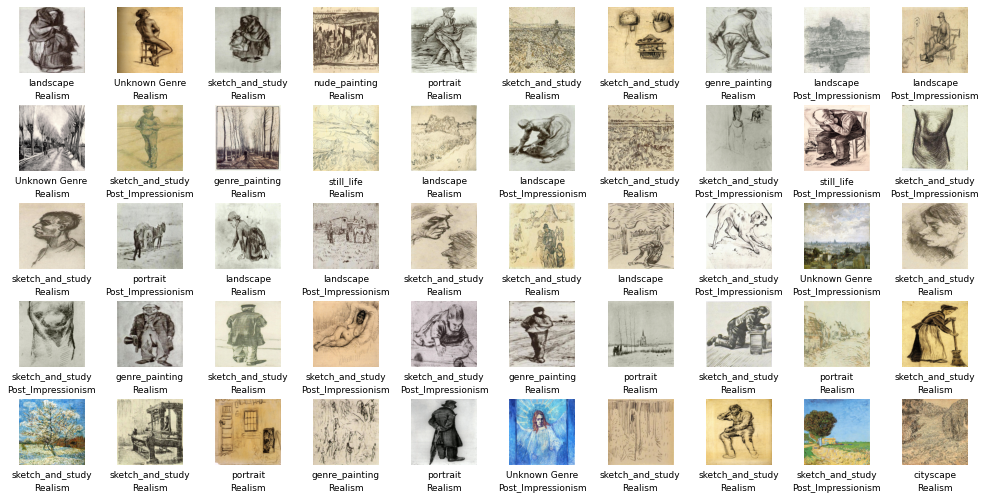

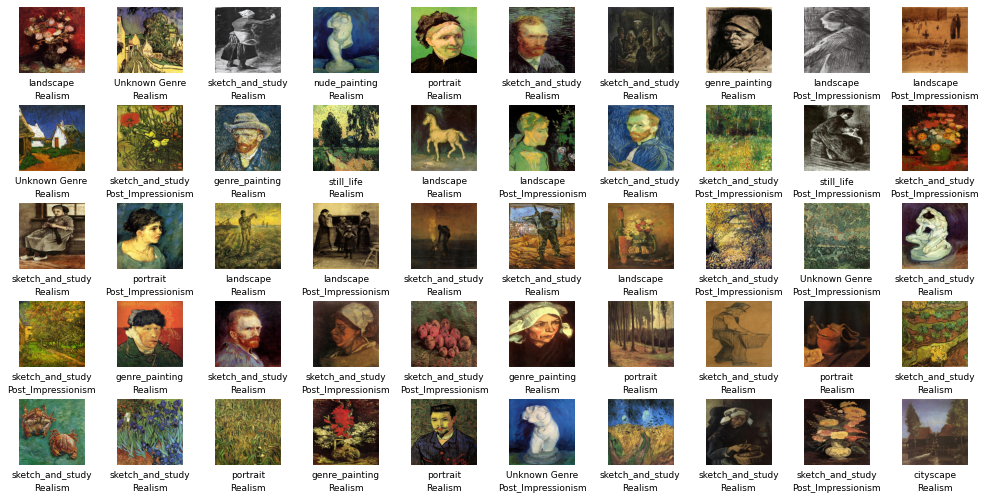

In [192]:
# draw_paints for each label 0 to 5
for i in range(3):
    draw_paints(images[km_fix.labels_ == i], 1.7, 50)

### Van Googh's Artwork Classification Experiment, If image is resized to 100x100

In [11]:
from io import BytesIO
from PIL import Image
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def load_image(image, image_size=256):
    image = Image.open(BytesIO(image['bytes']))
    image = image.resize((image_size, image_size))
    # image = image.convert('L') # grey scale
    return image

def draw_paints(df, arr, ratio=1, limit=20):
    n = len(arr) if len(arr) < limit else limit
    rows = int(np.ceil(n/10))
    cols = n if rows < 2 else 10
    fig, axs = plt.subplots(rows, cols, figsize=(cols*ratio, rows*ratio), squeeze=False, gridspec_kw={'wspace':0.5, 'hspace':0.4})
    for i in range(rows):
        for j in range(cols):
            idx = i*10 + j
            lb_genre = genre[df['genre'][idx]]
            lb_style = style[df['style'][idx]]
            if idx < n:
                axs[i, j].imshow(arr[idx], cmap='gray_r')
                axs[i, j].text(0.5, -0.2, lb_genre, size=9, ha='center', transform=axs[i, j].transAxes)
                axs[i, j].text(0.5, -0.4, lb_style, size=9, ha='center', transform=axs[i, j].transAxes)
            axs[i, j].axis('off')
    plt.show()

def clustering_by_kmeans_and_draw_paints(df_artist, n_clusters=4, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)
    
    km = KMeans(init='random', n_clusters=n_clusters, random_state=42)
    km.fit(images_2d)
        
    # draw_paints for each label 0 to 4
    for i in range(n_clusters):
        draw_paints(df_artist, images[km.labels_ == i], 1.7)

def draw_elbow(df_artist, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)

    inertia = []
    for k in range(2, 5):
        km = KMeans(n_clusters=k, random_state=42)
        km.fit(images_2d)
        inertia.append(km.inertia_)

    plt.plot(range(2, 5), inertia)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.show()

In [64]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

def print_bench_k_means(df_artist, n_clusters=4, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)
    
    data = images_2d
    labels = df_artist['style'].to_numpy()

    print(82 * "_")
    print("init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette")

    kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4, random_state=42)
    bench_k_means(kmeans=kmeans, name="k-means++", data=data, labels=labels)

    kmeans = KMeans(init="random", n_clusters=n_clusters, n_init=4, random_state=42)
    bench_k_means(kmeans=kmeans, name="random", data=data, labels=labels)

    pca = PCA(n_components=n_digits).fit(data)
    kmeans = KMeans(init=pca.components_, n_clusters=n_digits, n_init=1)
    bench_k_means(kmeans=kmeans, name="PCA-based", data=data, labels=labels)

    print(82 * "_")

def classification_by_kmeans(df_artist, n_clusters=4, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)
    
    km = KMeans(init='random', n_clusters=n_clusters, random_state=42)
    km.fit(images_2d)
    
    # draw paint for each label
    for i in range(n_clusters):
        draw_paints(df_artist, images[km.labels_ == i], 1.7)
    
    return km.labels_

### Classification Experiment of Images Resized

In [65]:
print_bench_k_means(df_gogh, 3, 100, False)

__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	5.573s	36849941	0.003	0.002	0.003	0.003	0.002	0.154
random   	4.748s	36850212	0.003	0.002	0.002	0.003	0.002	0.147
PCA-based	5.545s	31129003	0.062	0.019	0.029	0.014	0.027	0.061
__________________________________________________________________________________


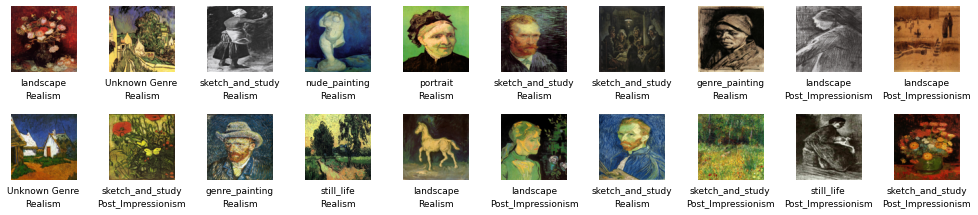

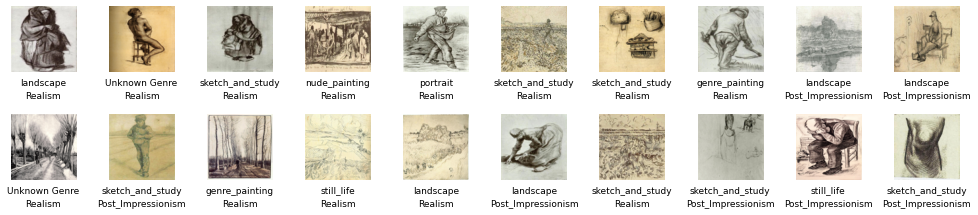

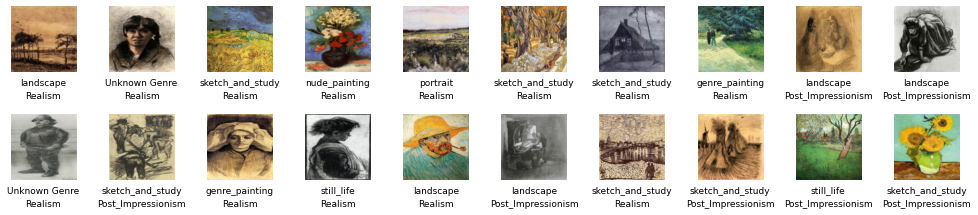

array([2, 0, 1, ..., 1, 1, 1], dtype=int32)

In [19]:
# classification of van gogh paintings by kmeans (size: 100, color: rgb)
classification_by_kmeans(df_gogh, 3, 100, False)

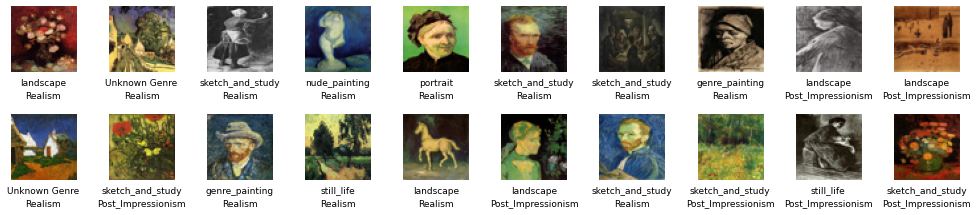

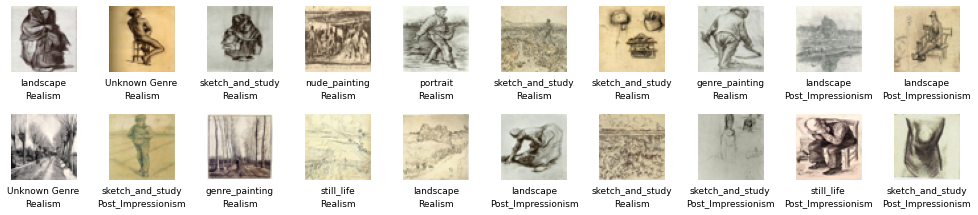

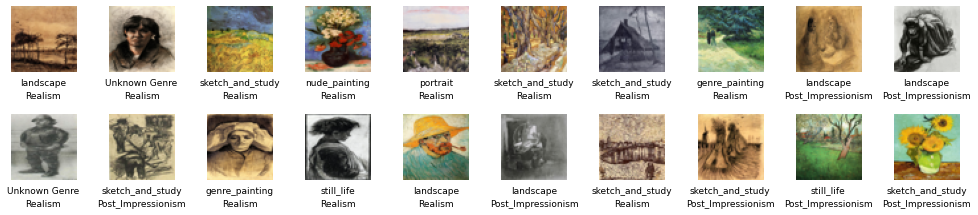

array([2, 0, 1, ..., 1, 1, 1], dtype=int32)

In [20]:
# classification of van gogh paintings by kmeans (size: 100, color: rgb)
classification_by_kmeans(df_gogh, 3, 50, False)

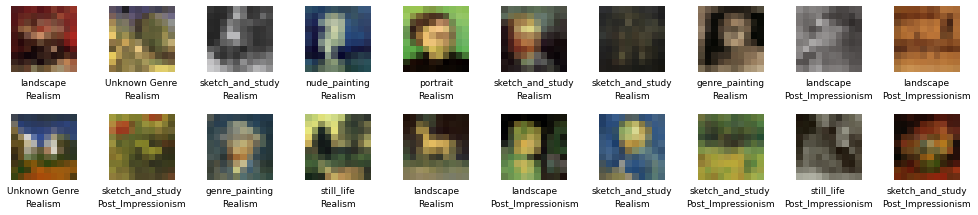

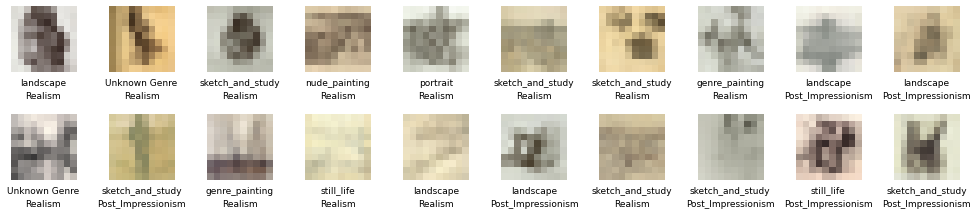

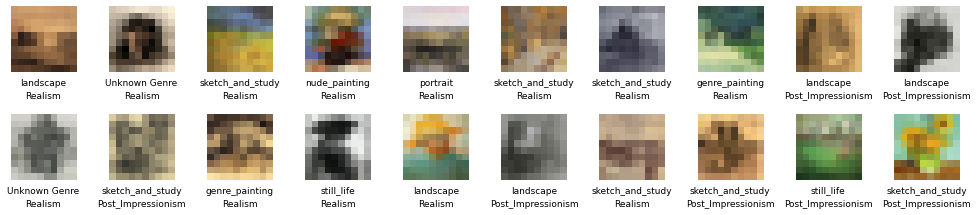

array([2, 0, 1, ..., 1, 1, 1], dtype=int32)

In [21]:
# classification of van gogh paintings by kmeans (size: 100, color: rgb)
classification_by_kmeans(df_gogh, 3, 10, False)

### Classification by DBSCAN

In [14]:
from sklearn.cluster import DBSCAN

def classification_by_dbscan(df_artist, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)

    db = DBSCAN(eps=0.5, min_samples=10)
    db.fit(images_2d)
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    
    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)

    # draw_paints for each cluster
    for i in range(n_clusters_):
        draw_paints(df_artist, images[db.labels_ == i], 1.7)

In [15]:
classification_by_dbscan(df_gogh)

Estimated number of clusters: 0
Estimated number of noise points: 1889


### Van Gogh's Artwork Classification by Autoencoder and CNN

In [28]:
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

def classification_by_autoencoder(images_2d):
    # Create autoencoder
    model = Sequential()
    model.add(Dense(256, activation='relu', input_shape=(256*256*3,)))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(256*256*3, activation='sigmoid'))
    model.compile(optimizer='adam', loss='mse')

    # Train autoencoder
    model.fit(images_2d, images_2d, epochs=10)

    # Predict images_2d
    images_2d_pred = model.predict(images_2d)

    # Calculate reconstruction error
    mse = np.mean(np.power(images_2d - images_2d_pred, 2), axis=1)
    print(mse.shape)

    # Plot reconstruction error
    sns.histplot(mse, bins=50, kde=True)
    plt.show()

    # Plot images with reconstruction error > 0.01
    draw_paints(images[mse > 0.01], 1.7, 50)

2023-10-08 08:29:35.566449: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/10
60/60 [==============================] - 35s 562ms/step - loss: 22016.3594
Epoch 2/10
60/60 [==============================] - 38s 625ms/step - loss: 22014.2734
Epoch 3/10
60/60 [==============================] - 36s 600ms/step - loss: 22014.2852
Epoch 4/10
60/60 [==============================] - 35s 580ms/step - loss: 22014.2734
Epoch 5/10
60/60 [==============================] - 48s 810ms/step - loss: 22014.2734
Epoch 6/10
60/60 [==============================] - 41s 682ms/step - loss: 22014.2793
Epoch 7/10
60/60 [==============================] - 49s 827ms/step - loss: 22014.2832
Epoch 8/10
60/60 [==============================] - 50s 832ms/step - loss: 22014.2715
Epoch 9/10
60/60 [==============================] - 64s 1s/step - loss: 22014.2812
Epoch 10/10
60/60 [==============================] - 51s 848ms/step - loss: 22014.2715
(1889,)


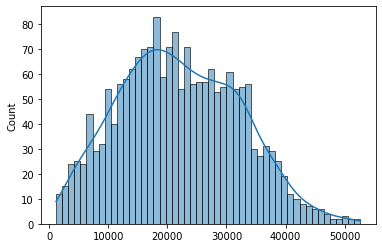

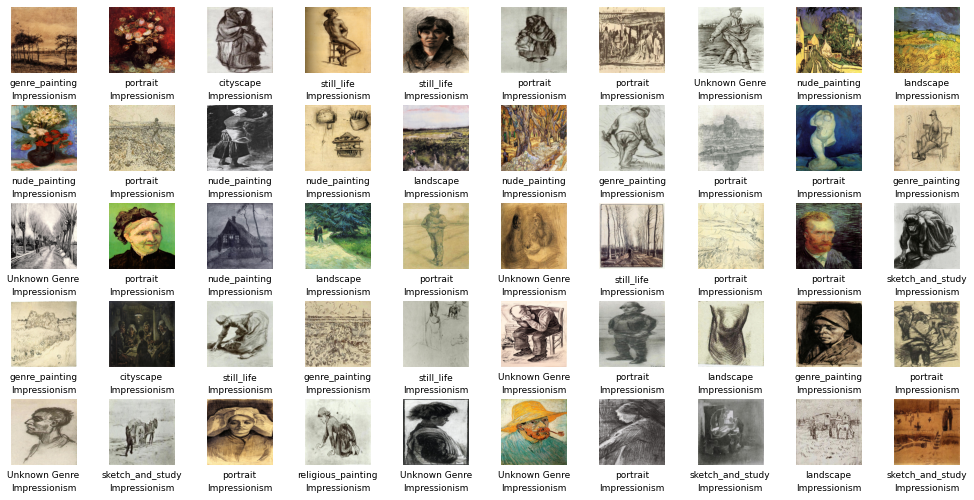

In [29]:
classification_by_autoencoder(images_2d)

## Renoir's Artwork Classification

In [9]:
df['artist'].value_counts()

0      41914
22      1889
14      1819
17      1400
4       1334
       ...  
111       84
34        83
127       75
122       48
128       42
Name: artist, Length: 129, dtype: int64

In [10]:
print(dataset.features['artist'].int2str(14))
print(dataset.features['artist'].int2str(17))
print(dataset.features['artist'].int2str(4))

nicholas-roerich
pierre-auguste-renoir
claude-monet


In [5]:
df_renoir = df[df.apply(lambda x: x['artist'] == 17, axis=1)]
df_renoir.reset_index(drop=True, inplace=True)

print(df_renoir[:5])
df_renoir.describe()

                                               image  artist  genre  style
0  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      17      2     12
1  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      17      6     12
2  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      17      1     12
3  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      17      9     12
4  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      17      9     12


,artist,genre,style
count,1400.0,1400.000000,1400.000000
mean,17.0,5.429286,12.154286
std,0.0,2.454882,1.168650
min,17.0,1.000000,12.000000
25%,17.0,4.000000,12.000000
50%,17.0,6.000000,12.000000
75%,17.0,6.000000,12.000000
max,17.0,10.000000,21.000000


In [6]:
for i, _ in iter(df_renoir['style'].value_counts().items()):
    print(i, dataset.features['style'].int2str(i))

12 Impressionism
21 Realism


In [7]:
for i, _ in iter(df_renoir['genre'].value_counts().items()):
    print(i, dataset.features['genre'].int2str(i))

6 portrait
4 landscape
2 genre_painting
10 Unknown Genre
5 nude_painting
9 still_life
8 sketch_and_study
1 cityscape
7 religious_painting


In [12]:
# Load all images
images = []
for i in range(len(df_renoir)):
    img = load_image(df_renoir['image'][i])
    images.append(np.array(img))

# Convert images to numpy array
images = np.array(images)
images.shape

(1400, 256, 256, 3)

In [13]:
from sklearn.cluster import KMeans

images_2d = images.reshape(-1, 256*256*3)

(array([0, 1, 2], dtype=int32), array([389, 536, 475]))


In [14]:
inertia = []
for k in range(2, 7):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(images_2d)
    inertia.append(km.inertia_)

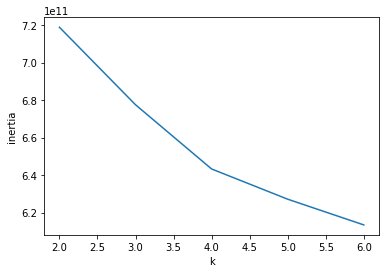

In [17]:
import matplotlib.pyplot as plt

plt.plot(range(2, 7), inertia)
plt.xlabel('k')
plt.ylabel('inertia')
plt.show()

In [18]:
km = KMeans(init='random', n_clusters=4, random_state=42)
km.fit(images_2d)

print(np.unique(km.labels_, return_counts=True))

(array([0, 1, 2, 3], dtype=int32), array([396, 353, 432, 219]))


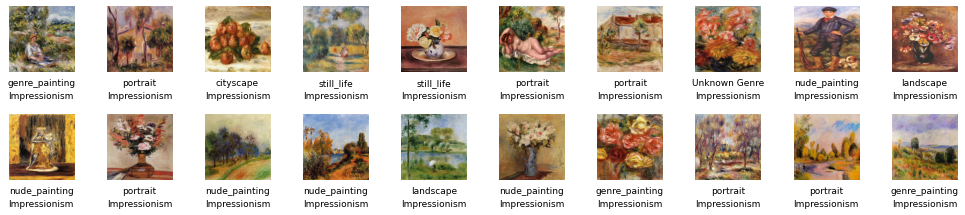

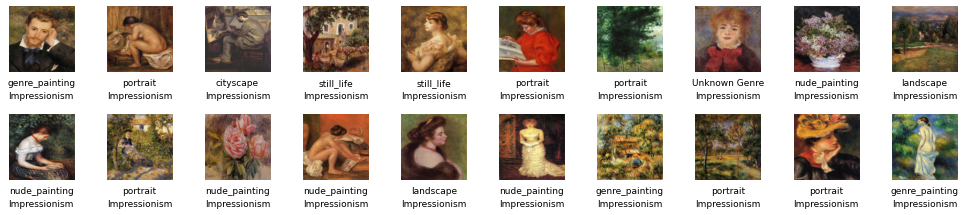

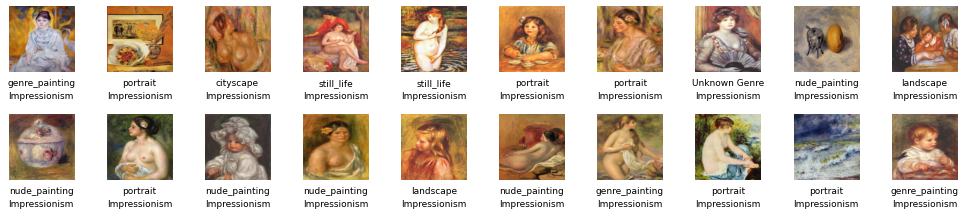

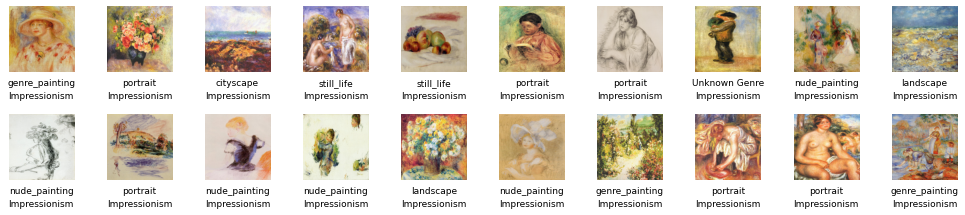

In [19]:
import matplotlib.pyplot as plt

def draw_paints(arr, ratio=1, limit=20):
    n = len(arr) if len(arr) < limit else limit
    rows = int(np.ceil(n/10))
    cols = n if rows < 2 else 10
    fig, axs = plt.subplots(rows, cols, figsize=(cols*ratio, rows*ratio), squeeze=False, gridspec_kw={'wspace':0.5, 'hspace':0.4})
    for i in range(rows):
        for j in range(cols):
            idx = i*10 + j
            lb_genre = genre[df_renoir['genre'][idx]]
            lb_style = style[df_renoir['style'][idx]]
            if idx < n:
                axs[i, j].imshow(arr[idx], cmap='gray_r')
                axs[i, j].text(0.5, -0.2, lb_genre, size=9, ha='center', transform=axs[i, j].transAxes)
                axs[i, j].text(0.5, -0.4, lb_style, size=9, ha='center', transform=axs[i, j].transAxes)
            axs[i, j].axis('off')
    plt.show()
    
# draw_paints for each label 0 to 4
for i in range(4):
    draw_paints(images[km.labels_ == i], 1.7)

## Experiment with artists with few artworks

In [80]:
df_gustave = df[df.apply(lambda x: x['artist'] == 7, axis=1)].reset_index(drop=True, inplace=False)
print(df_gustave['artist'][0], dataset.features['artist'].int2str(df_gustave['artist'][0].item()), df_gustave['artist'].count())
df_mary = df[df.apply(lambda x: x['artist'] == 43, axis=1)].reset_index(drop=True, inplace=False)
print(df_mary['artist'][0], dataset.features['artist'].int2str(df_mary['artist'][0].item()), df_mary['artist'].count())
df_chagall = df[df.apply(lambda x: x['artist'] == 36, axis=1)].reset_index(drop=True, inplace=False)
print(df_chagall['artist'][0], dataset.features['artist'].int2str(df_chagall['artist'][0].item()), df_chagall['artist'].count())

7 gustave-dore 753
43 mary-cassatt 293
36 edvard-munch 150


In [89]:
from io import BytesIO
from PIL import Image

def load_image(image, image_size=256):
    image = Image.open(BytesIO(image['bytes']))
    image = image.resize((image_size, image_size))
    # image = image.convert('L') # grey scale
    return image

def draw_paints(df, arr, ratio=1, limit=20):
    n = len(arr) if len(arr) < limit else limit
    rows = int(np.ceil(n/10))
    cols = n if rows < 2 else 10
    fig, axs = plt.subplots(rows, cols, figsize=(cols*ratio, rows*ratio), squeeze=False, gridspec_kw={'wspace':0.5, 'hspace':0.4})
    for i in range(rows):
        for j in range(cols):
            idx = i*10 + j
            lb_genre = genre[df['genre'][idx]]
            lb_style = style[df['style'][idx]]
            if idx < n:
                axs[i, j].imshow(arr[idx], cmap='gray_r')
                axs[i, j].text(0.5, -0.2, lb_genre, size=9, ha='center', transform=axs[i, j].transAxes)
                axs[i, j].text(0.5, -0.4, lb_style, size=9, ha='center', transform=axs[i, j].transAxes)
            axs[i, j].axis('off')
    plt.show()

def clustering_by_kmeans_and_draw_paints(df_artist, n_clusters=4, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)
    
    km = KMeans(init='random', n_clusters=n_clusters, random_state=42)
    km.fit(images_2d)
        
    # draw_paints for each label 0 to 4
    for i in range(n_clusters):
        draw_paints(df_artist, images[km.labels_ == i], 1.7)

def draw_elbow(df_artist, image_size=256, gray_scale=False):
    # Load all images
    images = []
    for i in range(len(df_artist)):
        img = load_image(df_artist['image'][i], image_size)
        images.append(np.array(img))

    # Convert images to numpy array
    images = np.array(images)
    gray_scaled = 1 if gray_scale else 3
    images_2d = images.reshape(-1, image_size*image_size*gray_scaled)

    inertia = []
    for k in range(2, 5):
        km = KMeans(n_clusters=k, random_state=42)
        km.fit(images_2d)
        inertia.append(km.inertia_)

    plt.plot(range(2, 5), inertia)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.show()

7 gustave-dore 753


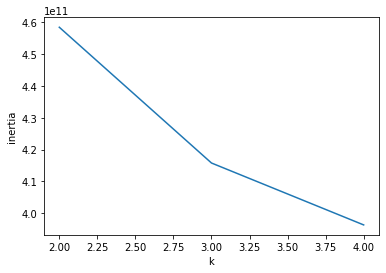

43 mary-cassatt 293


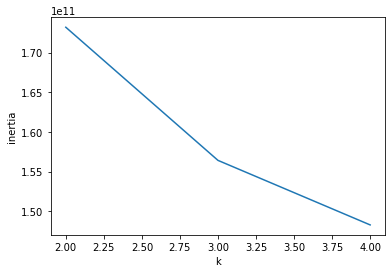

36 edvard-munch 150


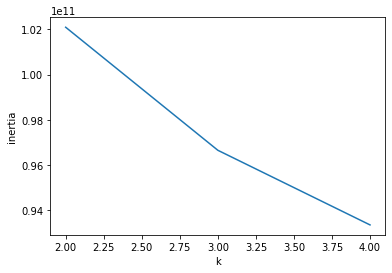

In [87]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

for df_artist in [df_gustave, df_mary, df_chagall]:
    print(df_artist['artist'][0], dataset.features['artist'].int2str(df_artist['artist'][0].item()), df_artist['artist'].count())
    
    draw_elbow(df_artist, 256, False)

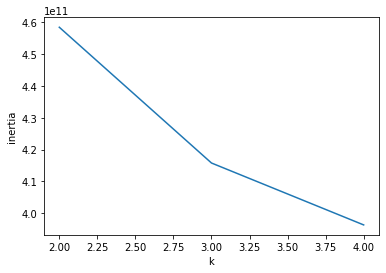

In [90]:
draw_elbow(df_gustave, 256, False)

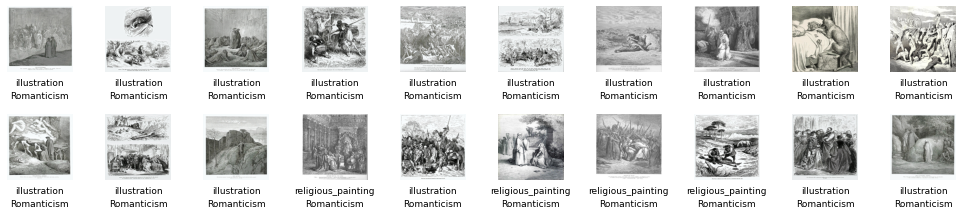

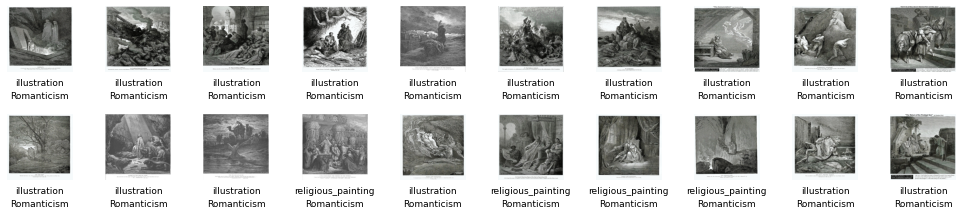

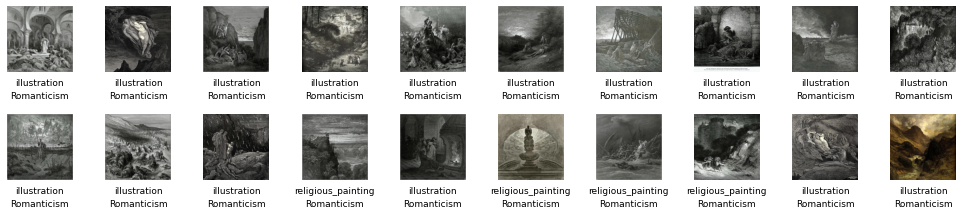

In [91]:
clustering_by_kmeans_and_draw_paints(df_gustave, 3, 256, False)

7 gustave-dore 753


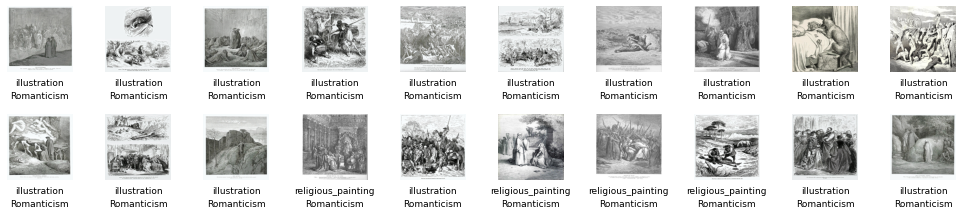

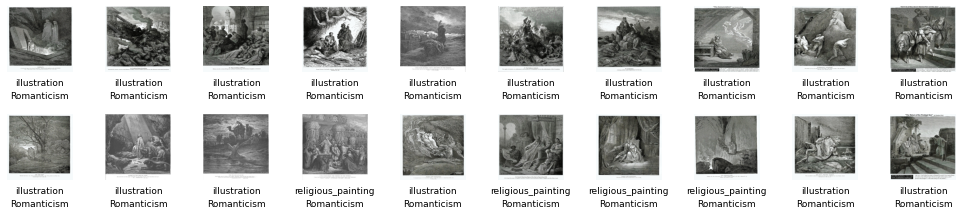

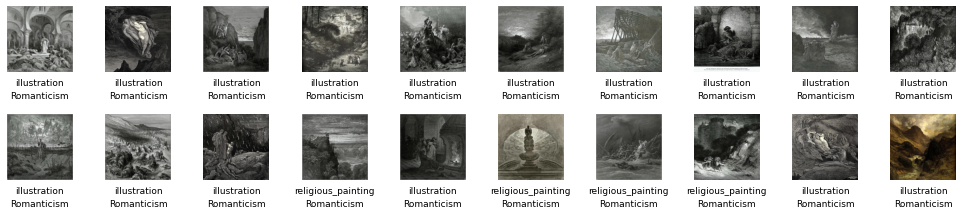

43 mary-cassatt 293


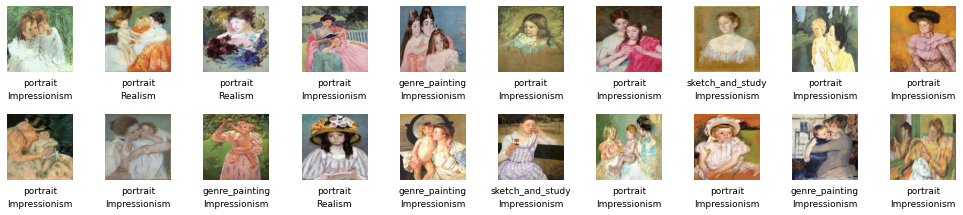

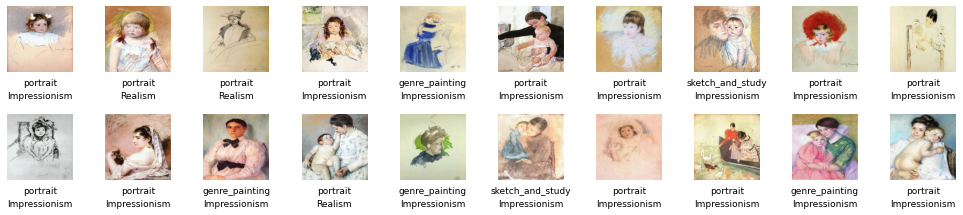

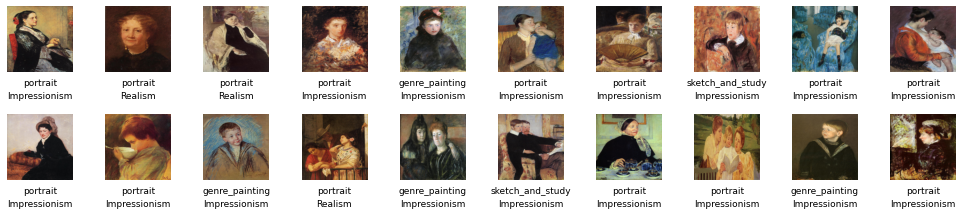

36 edvard-munch 150


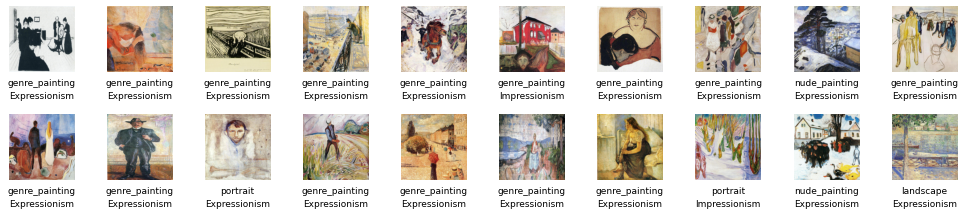

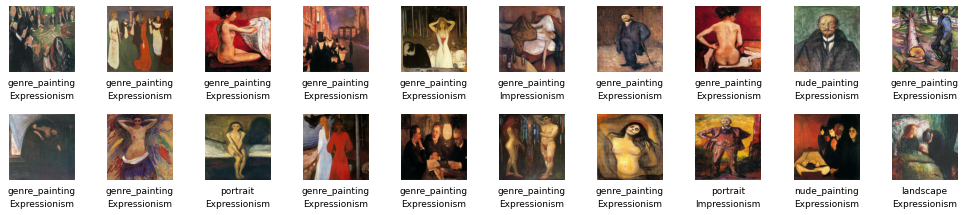

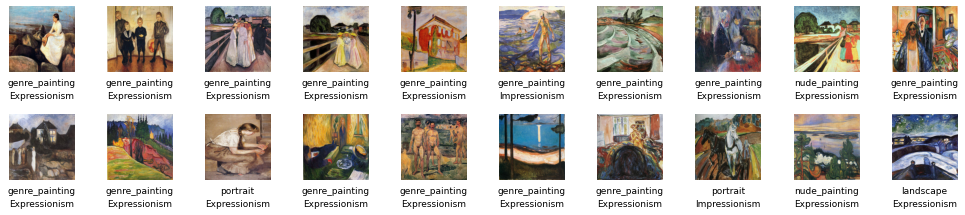

In [92]:
for df_artist in [df_gustave, df_mary, df_chagall]:
    print(df_artist['artist'][0], dataset.features['artist'].int2str(df_artist['artist'][0].item()), df_artist['artist'].count())

    clustering_by_kmeans_and_draw_paints(df_artist, 3, 256, False)